# Clustering and dimentiality reduction

## Outline

- [Necessary packages](#necessary_packages)
- [Load the dataset](#load_the_dataset)
- [Dataset description](#dataset_description)
- [Training](#training)
- [Evaluation](#evaluation)
- [3D Visualization](#3d_visualization)
- [Visualize The clusters](#visualize_clusters)

<div id="necessary_packages">
    <h3>Necessary packages</h3>
</div>

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import seaborn as sns
import plotly.express as px
from sklearn.decomposition import PCA,KernelPCA,NMF,TruncatedSVD
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score,f1_score,make_scorer,silhouette_score,davies_bouldin_score
from sklearn.preprocessing import MinMaxScaler
from tqdm.notebook import tqdm
from sklearn.pipeline import Pipeline

<div id="load_the_dataset">
    <h3>Load the dataset</h3>
</div>

In [3]:
def load_dataset(src: str,lables_src,size=5000):

    files = os.listdir(path=src)
    files.sort(key=lambda x : int(x.split(".")[0]))
    files = np.array(files)
    ids = np.arange(files.shape[0])
    
    if size is not None:
        ids = np.random.choice(ids, size=size,replace=False)
        files = files[ids]
        
    labels = pd.read_csv(lables_src).iloc[ids]["label"]
    images = []
    
    for i in tqdm(range(len(files))):
        file = files[i]
        img = plt.imread(fname=os.path.join(src, file))
        img = img.flatten()
        images.append(img)
        
    return np.array(images),labels

In [4]:
dataset,labels = load_dataset(src=os.path.join(".","cifar-10","train"),
        lables_src=os.path.join(".","cifar-10","trainLabels.csv"),size=None)

  0%|          | 0/50000 [00:00<?, ?it/s]

<div id="dataset_description">
    <h3>Dataset description</h3>
</div>

- The dimensions of the dataset

In [5]:
dataset.shape

(50000, 3072)

- The number of data points per lable

<Axes: xlabel='label', ylabel='count'>

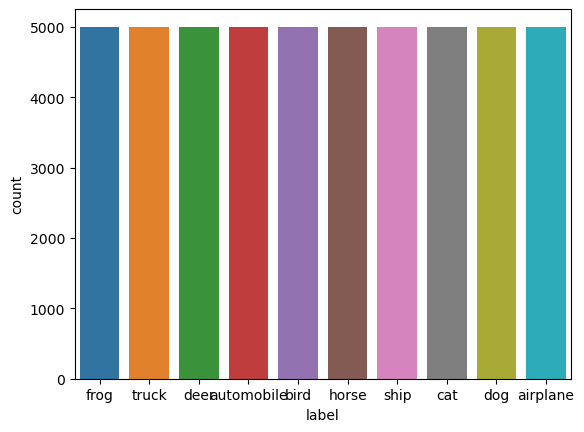

In [6]:
sns.countplot(x=labels)

- some instances

In [7]:
def plot_random_samples(images,labels,nrows=3,ncols=3):
    indices = np.random.choice(np.arange(images.shape[0]),size=nrows * ncols,replace=False)
    images = images[indices]
    labels = labels.iloc[indices]
    images = images.reshape(nrows * ncols, 32, 32, 3)
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols)

    i = 0
    for row in axes:
        for cell in row:
            cell.imshow(images[i])
            cell.set_title(labels.iloc[i])
            i += 1

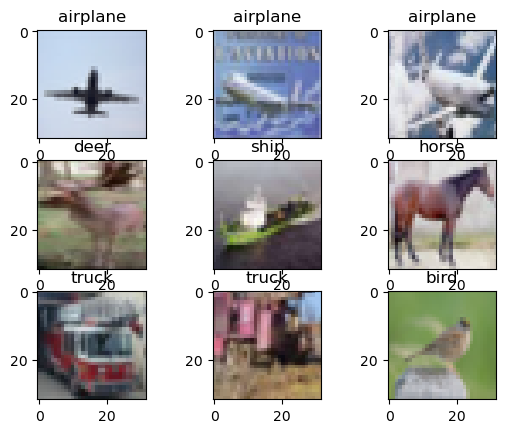

In [8]:
plot_random_samples(dataset,labels)

<div id="training">
    <h3>Training</h3>
</div>

#### choosing the right number of dimensions

In [9]:
pca = PCA().fit(dataset)

<Axes: >

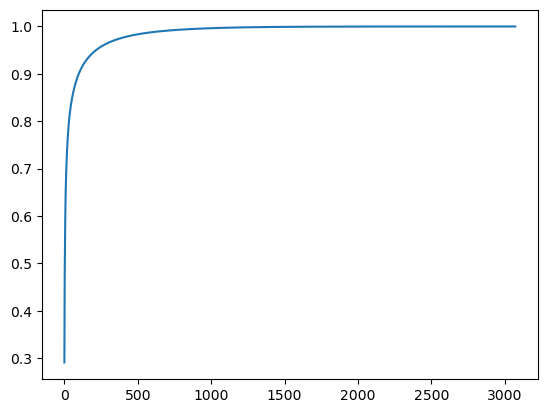

In [10]:
x = pd.Series(pca.explained_variance_ratio_.cumsum())
sns.lineplot(x=x.index,y=x.values)

In [11]:
min_variance = 0.9
(x < min_variance).sum()

98

#### models

In [12]:
models = {}

In [13]:
models["pca"] = Pipeline(steps=[
    ("dr", PCA(n_components=100)),
    ("estimator", KMeans(n_clusters=10,n_init=10,init='k-means++'))
])

In [14]:
models["nmf"] = Pipeline(steps=[
    ("dr", NMF(n_components=100)),
    ("scaler",MinMaxScaler()),
    ("estimator", KMeans(n_clusters=10,n_init=10,init='k-means++'))
])

In [15]:
models["svd"] = Pipeline(steps=[
    ("dr", TruncatedSVD(n_components=100)),
    ("estimator", KMeans(n_clusters=10,n_init=10,init='k-means++'))
])

In [16]:
models["without_pca"] = Pipeline(steps=[
    ("estimator", KMeans(n_clusters=10,n_init=10,init='k-means++'))
])

In [17]:
def train(models,X):
    keys = list(models.keys())
    for i in tqdm(range(len(models))):
        models[keys[i]].fit(X)

In [18]:
train(models, X=dataset)

  0%|          | 0/4 [00:00<?, ?it/s]

/home/abdelnour/anaconda3/envs/ml/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1710: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


<div id="evaluation">
    <h3>Evaluation</h3>
</div>

In [19]:
def map_clusters_to_labels(labels,clusters):
    values = np.unique(clusters)
    lookup = np.zeros(values.shape).tolist()
    for value in values:
        _values,_counts = np.unique(labels[clusters == value],return_counts=True)
        label = _values[_counts.argmax()]
        lookup[value] = label
    lookup = np.array(lookup)
    return lookup[clusters]

In [20]:
def evluate(models,X,y,super_metrics,unsuper_metrics):
    columns = list(super_metrics.keys()) + list(unsuper_metrics.keys())
    index = models.keys()
    results = []
    for model in models.values():
        scores = []
        clusters = model.predict(X)
        labels = map_clusters_to_labels(y,clusters)
        for metric in super_metrics.values():
            value = metric(y_true=y, y_pred=labels)
            scores.append(value)
        for metric in unsuper_metrics.values():
            value = metric(X, clusters)
            scores.append(value)
        results.append(scores)
    return pd.DataFrame(results, index=index,columns=columns)

In [21]:
def f1_macro(y_true, y_pred):
    return f1_score(y_true=y_true, y_pred=y_pred,average="macro")

In [22]:
super_metrics = {
    "accuracy":accuracy_score,
    "f1_score":f1_macro
}

In [23]:
unsuper_metrics = {
    "silhouette_score":silhouette_score,
    "davies_bouldin_score":davies_bouldin_score
}

In [24]:
evluate(models,dataset,labels,super_metrics,unsuper_metrics)

/home/abdelnour/anaconda3/envs/ml/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1710: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


,accuracy,f1_score,silhouette_score,davies_bouldin_score
pca,0.22126,0.162597,0.050614,2.802847
nmf,0.20978,0.171266,-0.008623,4.846942
svd,0.22120,0.162508,0.050654,2.803831
without_pca,0.22154,0.162753,0.050630,2.804287


- Using PCA and SVD gives slightly better results comparing to the model that doesn't use any dimentiality reduction technique,in terms of silhouette score.
- FactorAnalysis gives the worst results in terms of .silhouette score,but better results in terms of accuracy/f1-score.

<div id="3d_visualization" >
    <h3>3D Visualization</h3>
</div>

In [25]:
clusters = models["svd"].predict(dataset)

In [26]:
X = PCA(n_components=3).fit_transform(dataset)

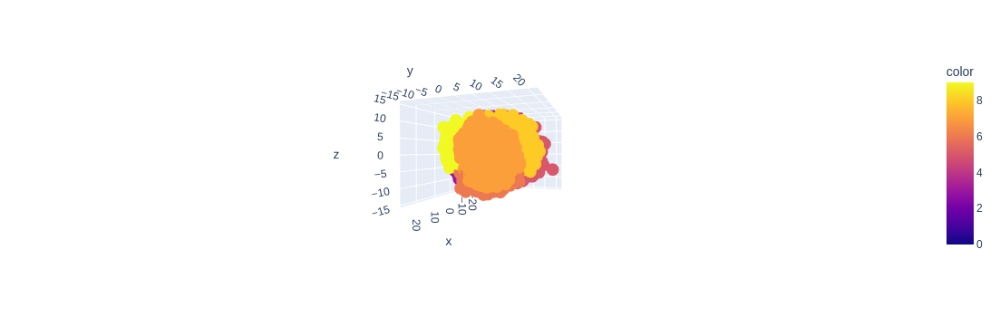

In [27]:
px.scatter_3d(x=X[:,0], y=X[:,1], z=X[:,2],
              color=clusters)

<h3 id="visualize_clusters" >Visualize the clusters</h3>

In [28]:
def plot_cluster(dataset,labels,nrows,ncols,clusters,cluster):
    plot_random_samples(dataset[clusters == cluster],labels[clusters == cluster],nrows=nrows,ncols=ncols)

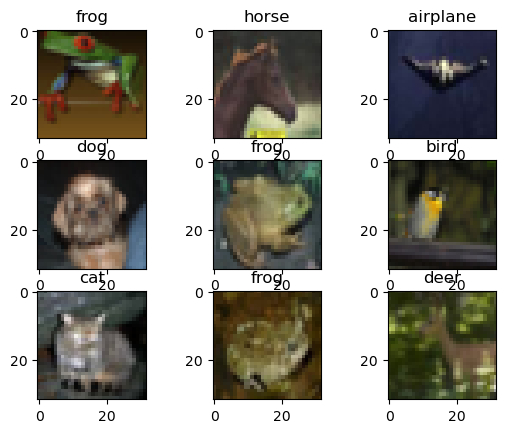

In [29]:
plot_cluster(dataset,labels,nrows=3,ncols=3,clusters=clusters,cluster=0)

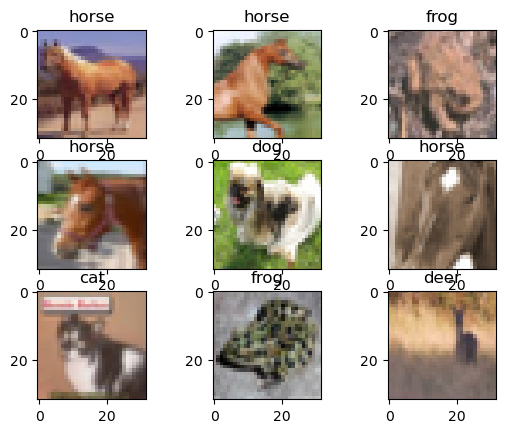

In [30]:
plot_cluster(dataset,labels,nrows=3,ncols=3,clusters=clusters,cluster=1)

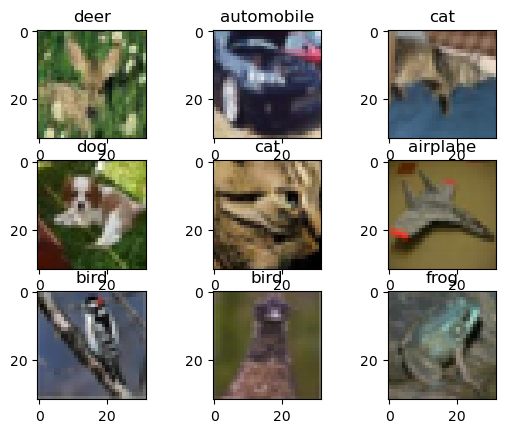

In [31]:
plot_cluster(dataset,labels,nrows=3,ncols=3,clusters=clusters,cluster=2)

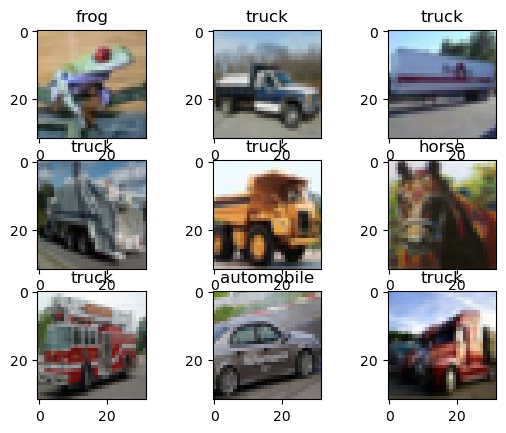

In [32]:
plot_cluster(dataset,labels,nrows=3,ncols=3,clusters=clusters,cluster=3)

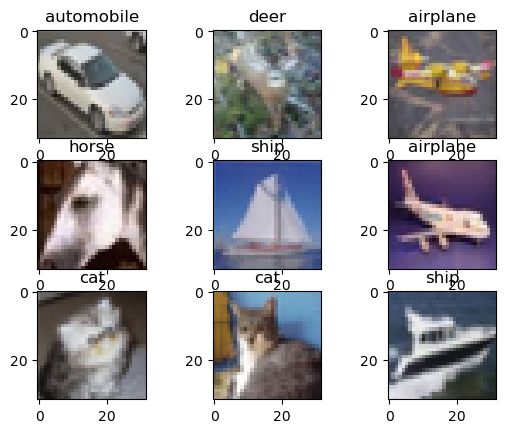

In [33]:
plot_cluster(dataset,labels,nrows=3,ncols=3,clusters=clusters,cluster=4)

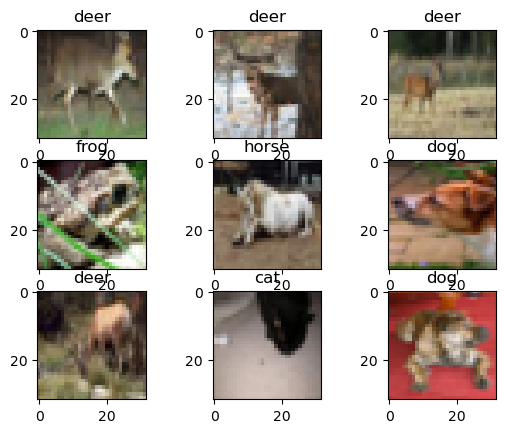

In [34]:
plot_cluster(dataset,labels,nrows=3,ncols=3,clusters=clusters,cluster=5)

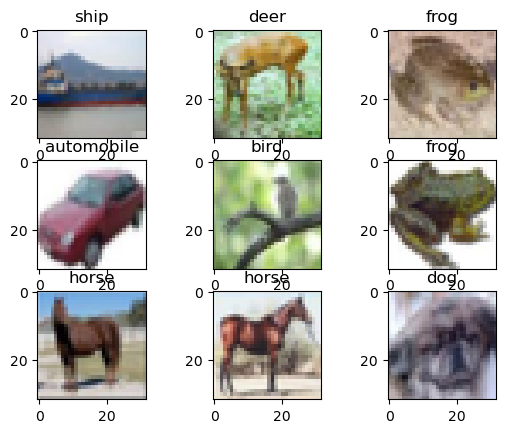

In [35]:
plot_cluster(dataset,labels,nrows=3,ncols=3,clusters=clusters,cluster=6)

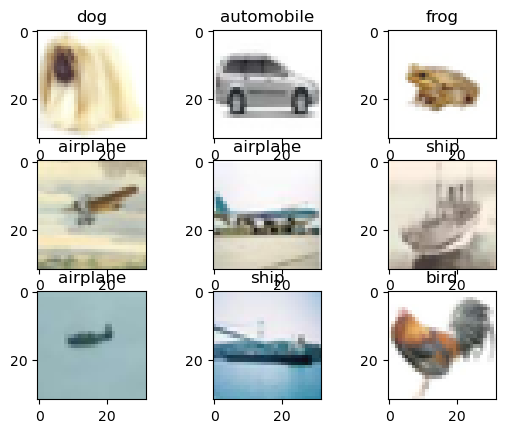

In [36]:
plot_cluster(dataset,labels,nrows=3,ncols=3,clusters=clusters,cluster=7)

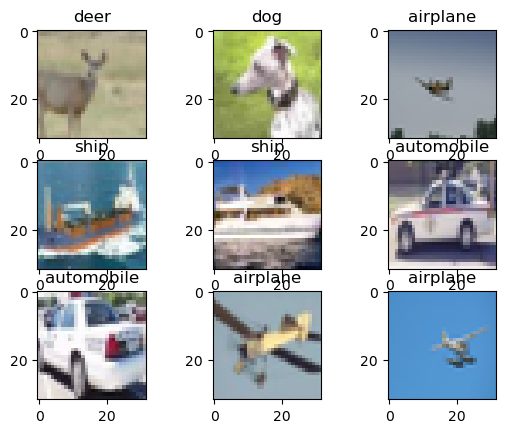

In [37]:
plot_cluster(dataset,labels,nrows=3,ncols=3,clusters=clusters,cluster=8)

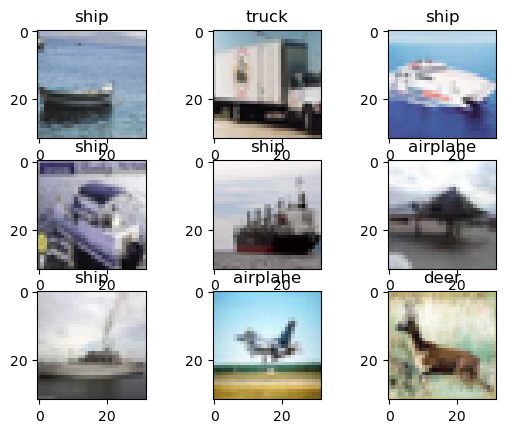

In [38]:
plot_cluster(dataset,labels,nrows=3,ncols=3,clusters=clusters,cluster=9)